<a href="https://colab.research.google.com/github/ibonetc/DeepLearning_Salud/blob/main/YOLOv5_ExampleRoboflow_BCCD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Red YOLO

https://github.com/ultralytics/yolov5

https://docs.ultralytics.com/quick-start/

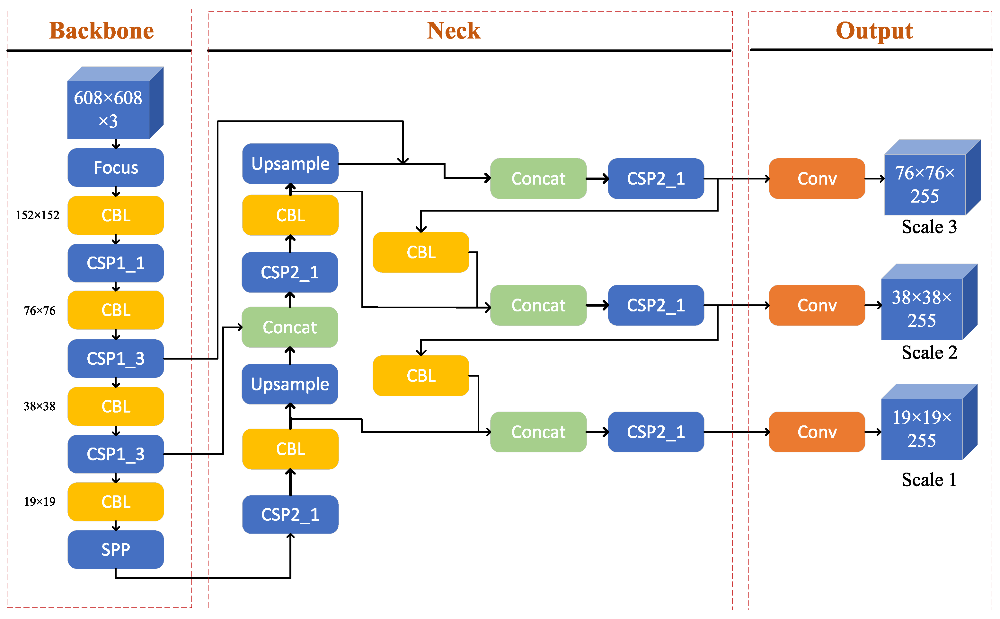

Tomada de: https://www.mdpi.com/2072-4292/13/18/3776/htm

# Ejemplo Base de datos BCCD

Si quieres crear tu propia base de datos necesita crear las anotaciones de la misma, o sea identificar las clases dentro de la imagen, para esto puedes usar roboflow: https://docs.roboflow.com/annotate

En este ejemplo vamos a usar la base de datos de ejemplo BCCD: https://public.roboflow.com/object-detection/bccd

En esta base de datos hay 364 imágenes en tres clases: WBC (glóbulos blancos), RBC (glóbulos rojos) y plaquetas. Hay 4888 etiquetas en 3 clases. Son 4155 RBC, 372 WBC y 361 Plaquetas.

Esta base de datos puede ser descargada del *roboflow* directamente usando una API, o puede ser descargada, en este caso para la versión YOLOv5, como haremos en este caso, que la tenemos en Drive.

In [1]:
!unzip /content/drive/MyDrive/HealthData/BCCD.v3-raw.yolov5pytorch.zip -d /content/BCCD/

Archive:  /content/drive/MyDrive/HealthData/BCCD.v3-raw.yolov5pytorch.zip
 extracting: /content/BCCD/README.dataset.txt  
 extracting: /content/BCCD/README.roboflow.txt  
 extracting: /content/BCCD/data.yaml  
   creating: /content/BCCD/test/
   creating: /content/BCCD/test/images/
 extracting: /content/BCCD/test/images/BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00062_jpg.rf.1cecc20a21ac39cb54cf532081a1e893.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00090_jpg.rf.5267690cb6a13608d39b0424bef3c9b4.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00099_jpg.rf.744666666386a07e242e214e041945ba.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00112_jpg.rf.e4b507506c4a70882bb23cb743061a66.jpg  
 extracting: /content/BCCD/test/images/BloodImage_00113_jpg.rf.250f3f0288ad89f4f961529434d99713.jpg  
 ex

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

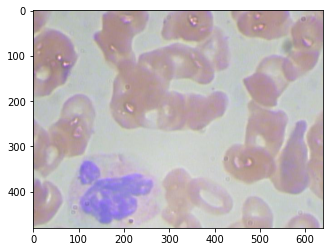

In [4]:
plt.figure()
img = mpimg.imread('/content/BCCD/train/images/BloodImage_00001_jpg.rf.d702f2b1212a2ed897b5607804109acf.jpg')
plt.imshow(img) 
plt.show() 

In [6]:
import glob
image_paths=glob.glob('/content/BCCD/train/images/*.jpg')

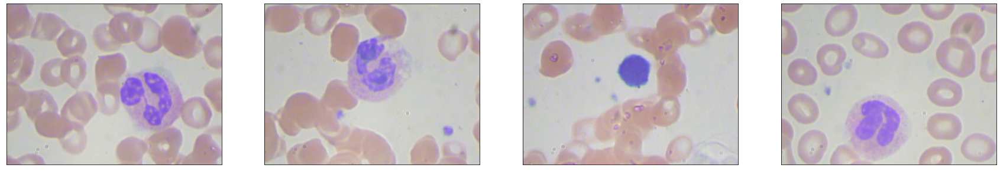

In [14]:
plt.figure(figsize=(30,60))
for i,imgP in enumerate(image_paths[0:4]):
  ax = plt.subplot(1, 4, i + 1)
  img = mpimg.imread(imgP) 
  plt.imshow(img)
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

In [4]:
import yaml
with open("/content/BCCD/data.yaml", 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

In [5]:
num_classes

'3'

Si vemos el fichero data.yaml es el que se genera automáticamenten las direcciones de las imágenes de entrenamiento y validación, así como la cantidad y los nombres de las clases.

Para que las direcciones de entrenamiento y validación estén correctas sin necesidad de cambiar los datos de dirección podemos ponerlas fichas. Copiemos las rutas de las mismas y pongámoslas en el fichero de forma que queden así:

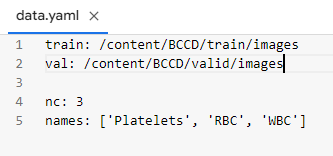



# Descargar modelo YOLOv5


Para esto vamos a seguir los siguientes pasos:
* Instalar dependencias YOLOv5
* Descargar datos personalizados de detección de objetos YOLOv5
* Escribir nuestra configuración de entrenamiento YOLOv5

**NOTA:** Recuerde elegir GPU en Runtime si aún no está seleccionado. 

*Entorno de ejecución --> Cambiar tipo de entorno de ejecución --> Acelerador de hardware --> GPU*)

## Instalar dependencas YOLOv5
Clonar el repositorio YOLOv5

Verificar que en content tenemos la carpeta *yolov5*

In [2]:
# clone repositorio YOLOv5
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 13286, done.
remote: Total 13286 (delta 0), reused 0 (delta 0), pack-reused 13286
Receiving objects: 100% (13286/13286), 12.03 MiB | 24.35 MiB/s, done.
Resolving deltas: 100% (9253/9253), done.
/content/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [6]:
!pip install -qr requirements.txt  # instalar dependencias (ignore los errores)
import torch

from IPython.display import Image, clear_output
from utils.google_utils import gdrive_download

print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     |████████████████████████████████| 596 kB 5.3 MB/s 
Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla K80', major=3, minor=7, total_memory=11441MB, multi_processor_count=13)


## Definir configuración y arquitectura

Escribiremos un script .yaml que defina los parámetros de nuestro modelo, como el número de clases y capa.

In [7]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [8]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Entrenar la red YOLO con este ejemplo

Como parámetros le pasamos número de batc h

In [10]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data /content/BCCD/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
github: ⚠️ WARNING: code is out of date by 1037 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
YOLOv5 v4.0-126-g886f1c0 torch 1.11.0+cu113 CUDA:0 (Tesla K80, 11441.1875MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/custom_yolov5s.yaml', data='/content/BCCD/data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs/train/yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=16, weights='', workers=8, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "te

## Evaluar la red

Las pérdidas de entrenamiento y las métricas de rendimiento se guardan en Tensorboard y también en un archivo de registro definido anteriormente con el indicador *--name* cuando entrenamos. En nuestro caso, lo llamamos yolov5s_results. (Si no se le asigna un nombre, el valor predeterminado es *results.txt*). El archivo de resultados se representa como un png una vez que finaliza el entrenamiento.

**Nota de Glenn**: Los archivos *results.txt* parcialmente completados se pueden trazar con *from utils.utils import plot_results; plot_results()*.

In [11]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

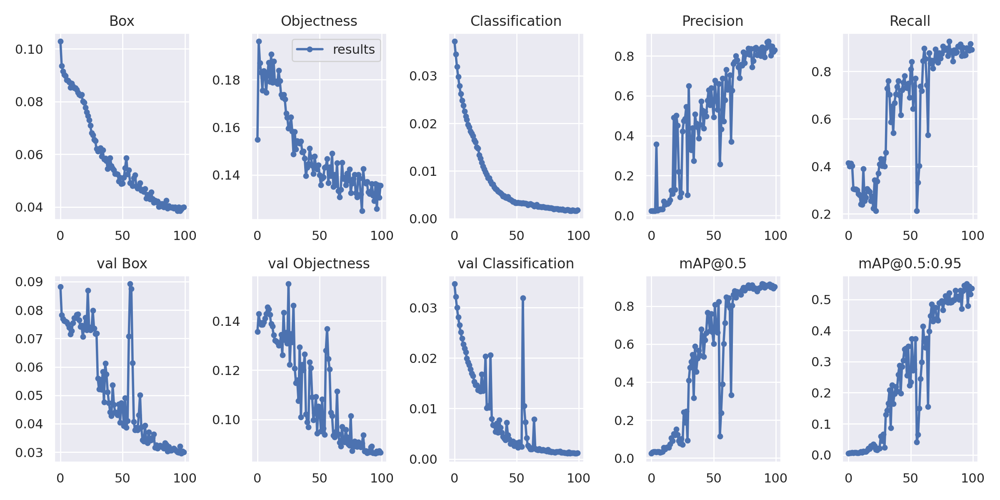

In [13]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

## Visualizar nuestros datos de entrenamiento con etiquetas

Después de que comience el entrenamiento, vea las imágenes `train*.jpg` para ver imágenes de entrenamiento, etiquetas y efectos de aumento.

Tenga en cuenta que se usa un cargador de datos de mosaico para el entrenamiento (que se muestra a continuación), un nuevo concepto de carga de datos desarrollado por Glenn Jocher y presentado por primera vez en [YOLOv4] (https://arxiv.org/abs/2004.10934).

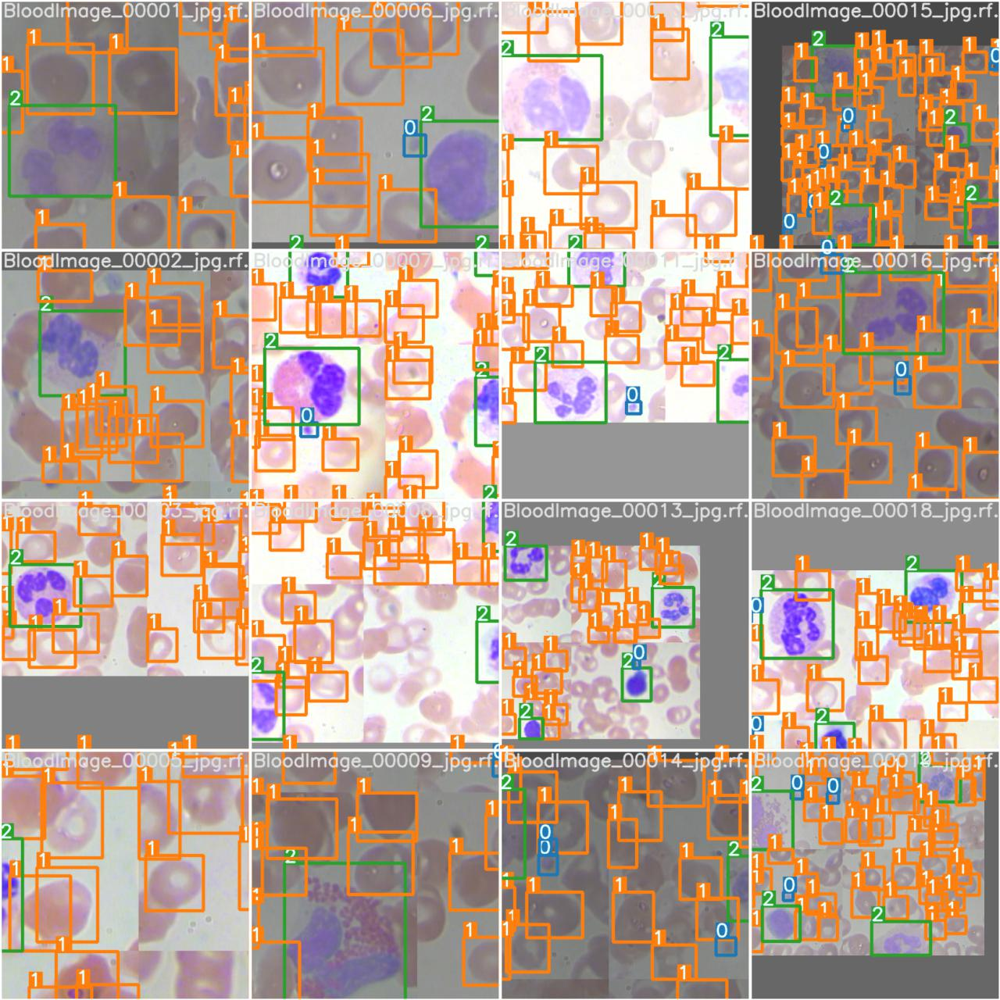

In [18]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=1000)

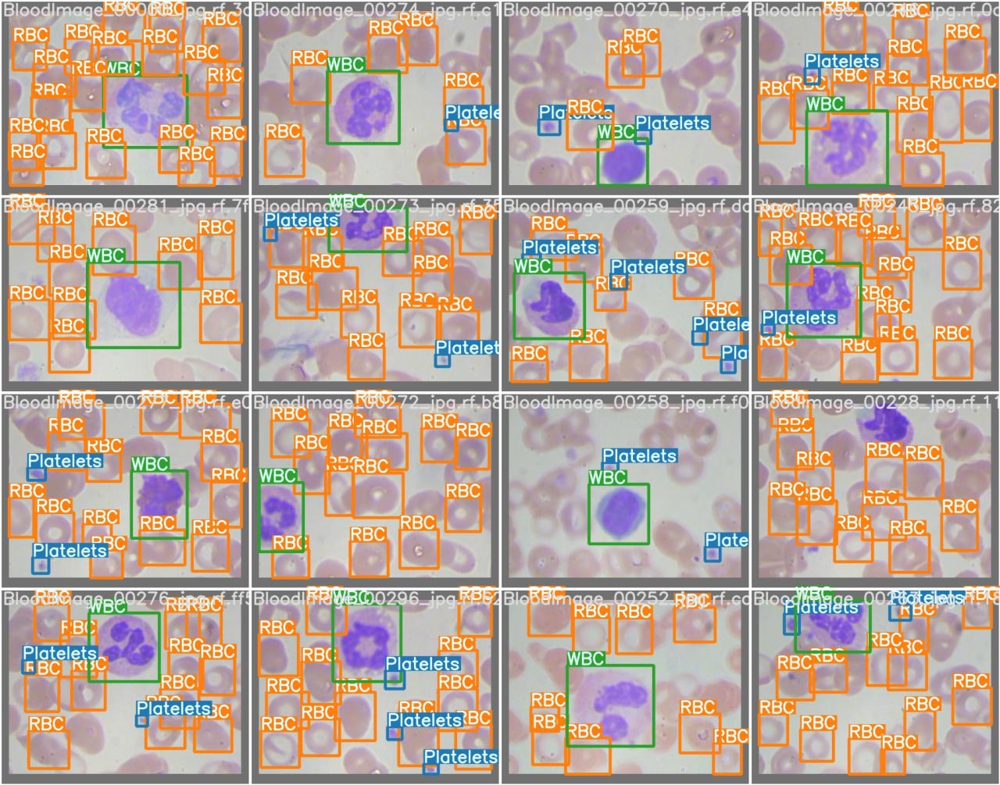

In [17]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/test_batch0_labels.jpg', width=1000)

## Ejecutar inferencia con pesos entrenados
Ejecute la inferencia con un punto de control entrenado previamente en el contenido de la carpeta de prueba/imágenes descargada de Roboflow.

In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/BCCD/test/images

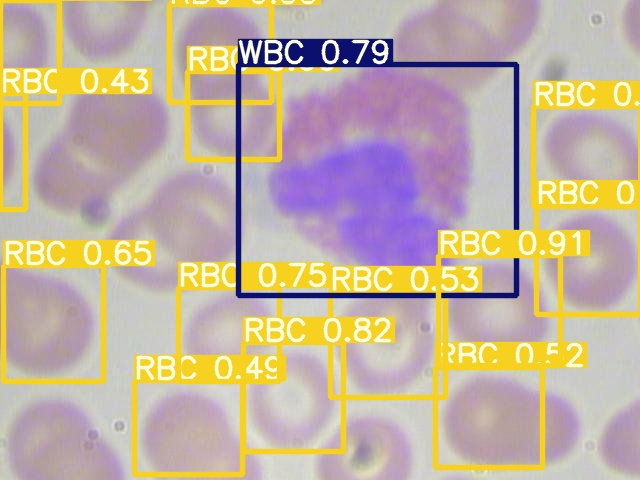

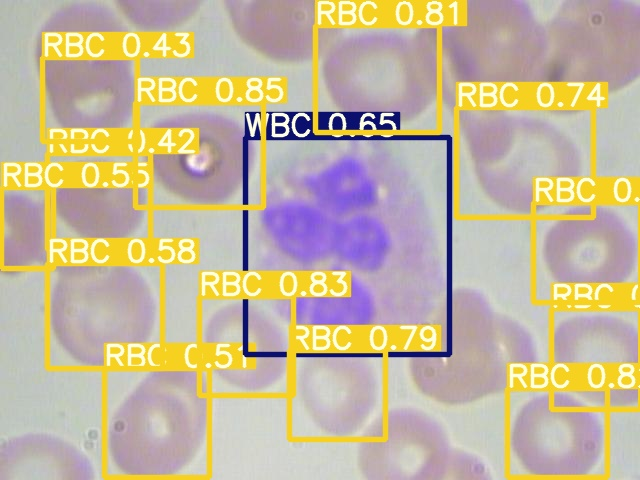

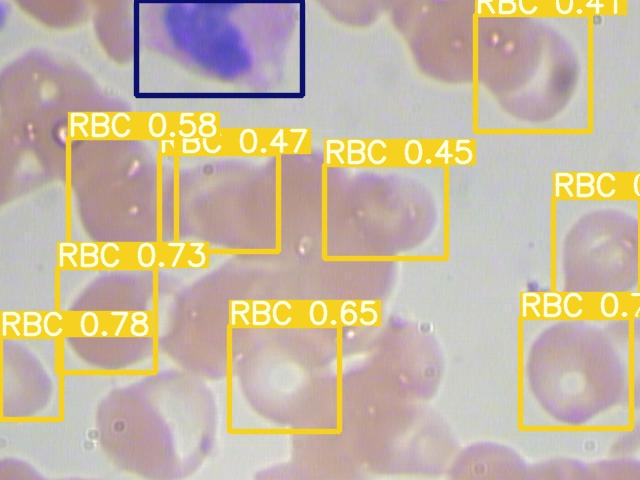

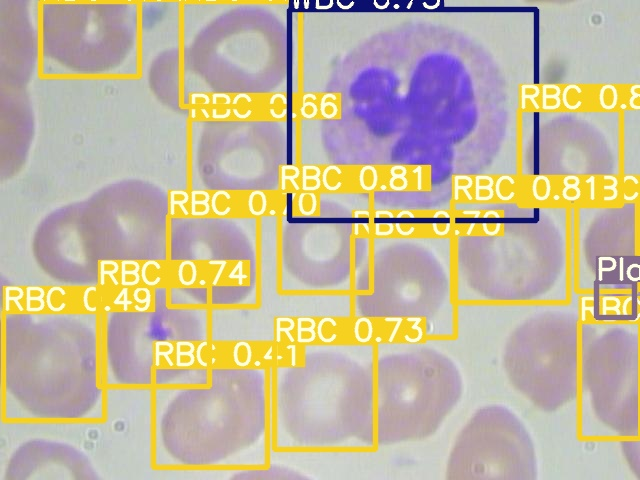

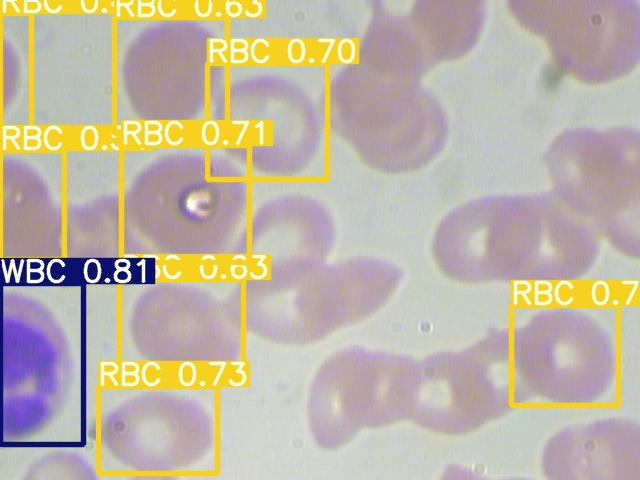

...

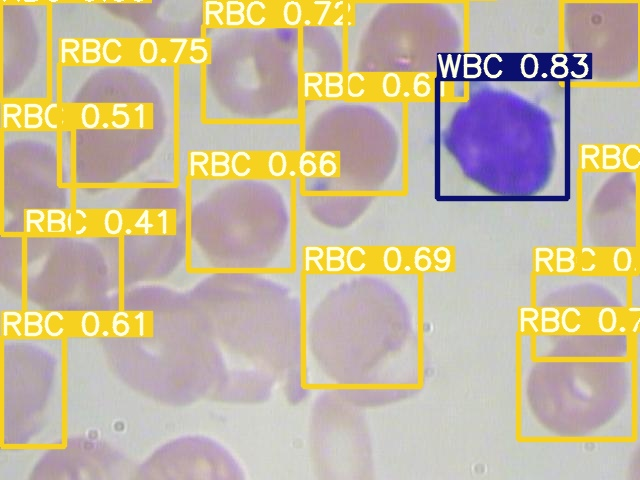

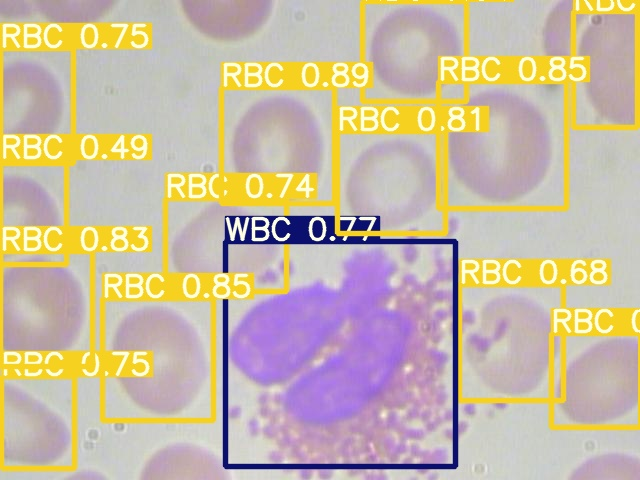

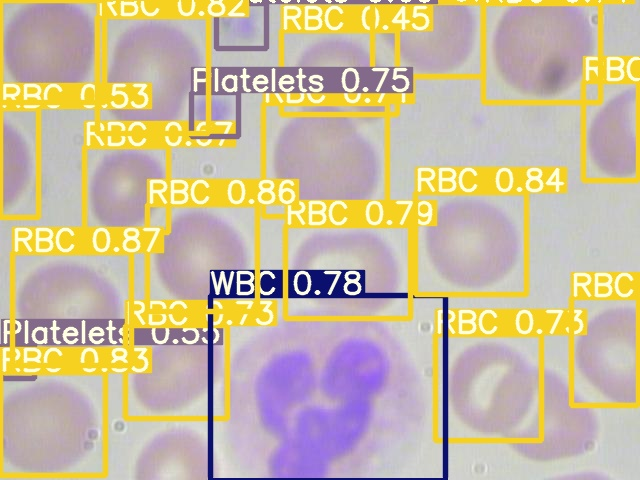

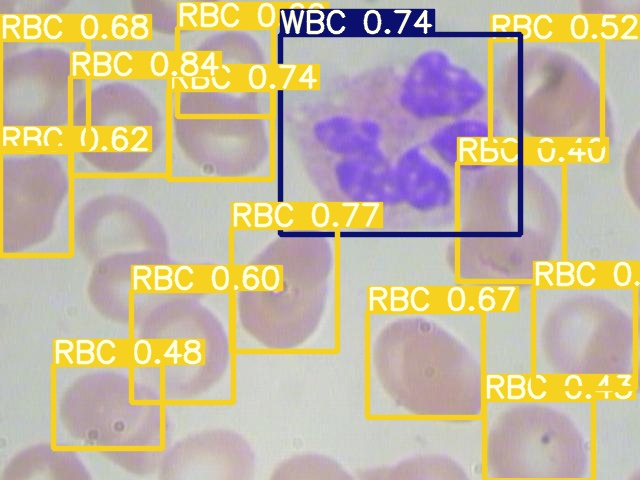

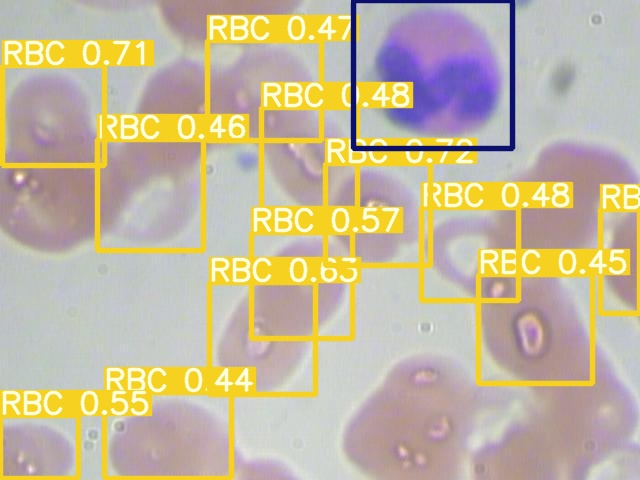

In [21]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename=imageName))
  print("\n")

# Exportar pesos entrenados para futuras inferencias

Ahora que ha entrenado su detector personalizado, puede exportar los pesos entrenados que ha hecho aquí para inferirlos en su dispositivo en otro lugar.

In [ ]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/My\ Drive